<img src="https://3a2vzv37nkuw3esf6a3u2t7s-wpengine.netdna-ssl.com/webcentral/wp-content/uploads/sites/267/2019/02/horizontaldarkbackground.jpg" width="55%" align="left"> 
<br><br><br><br><br>
<font size=3 color='#08088A'>
<b>CSCI250 Python Computing: Building a Sensor System</b> <br><br>
Capstone final report
</font>
<hr style="height:5px" width="55%" align="left">

# The Silly Security System (SSS)

<img src=attachment:6cb9ffca-7d2a-4898-a039-88e5ec3f8109.jpg width="600">
<img src=attachment:f3cce578-9d1e-4335-9ea4-882bbe2e1fec.jpg width="600">
<img src=attachment:92a17ea5-b0fe-4016-86b3-6be93d373af5.jpg width="600">
<img src=attachment:a2468f59-3067-45d8-b985-c6fb1d483c32.jpg width="600">
<img src=attachment:91bbc372-c74e-41e9-b738-7daef2370976.jpg width="600">
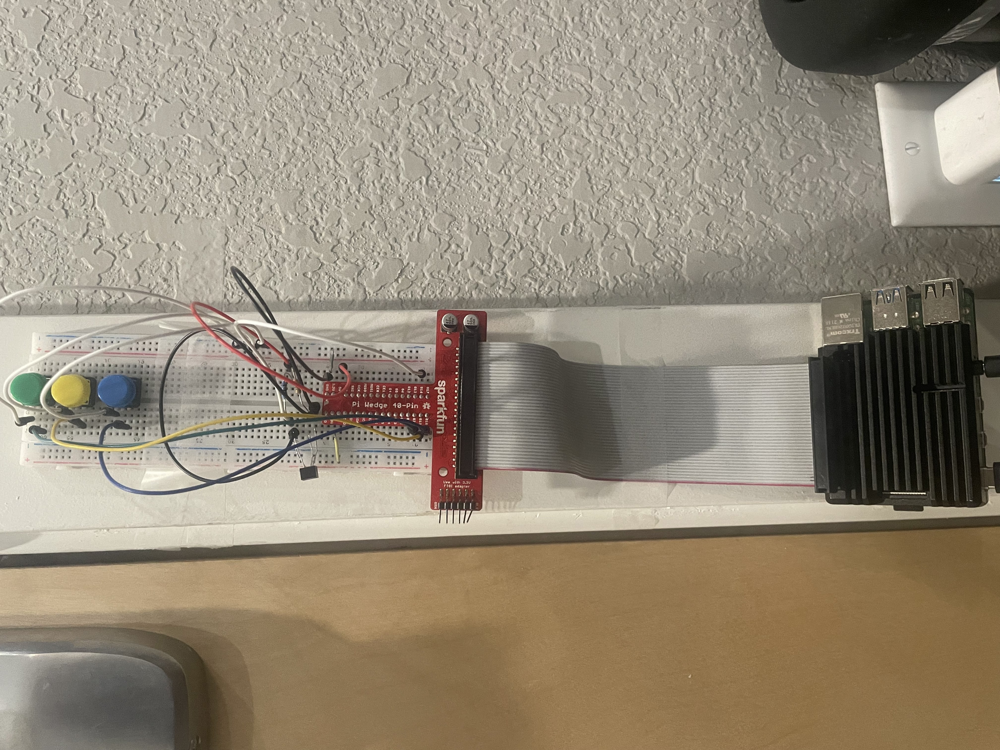
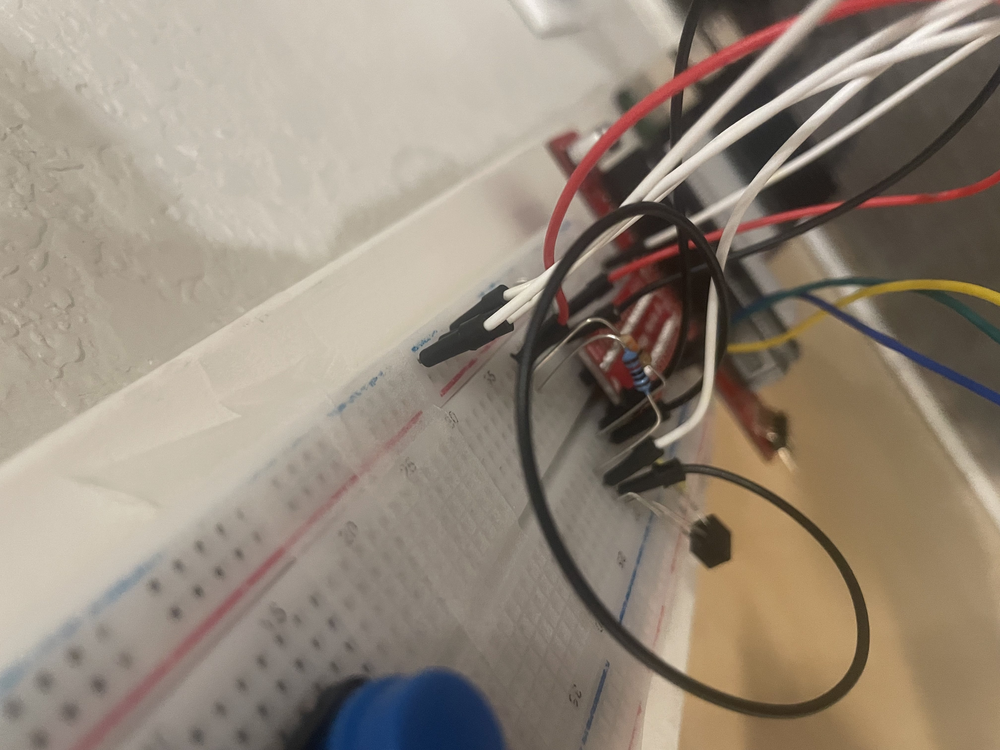
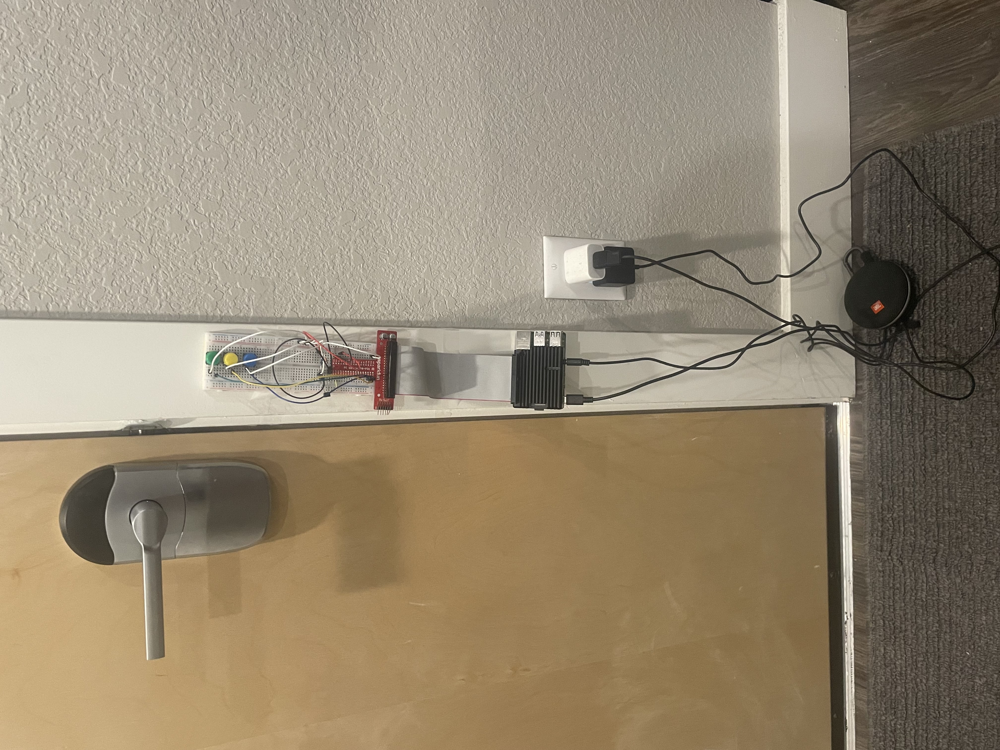
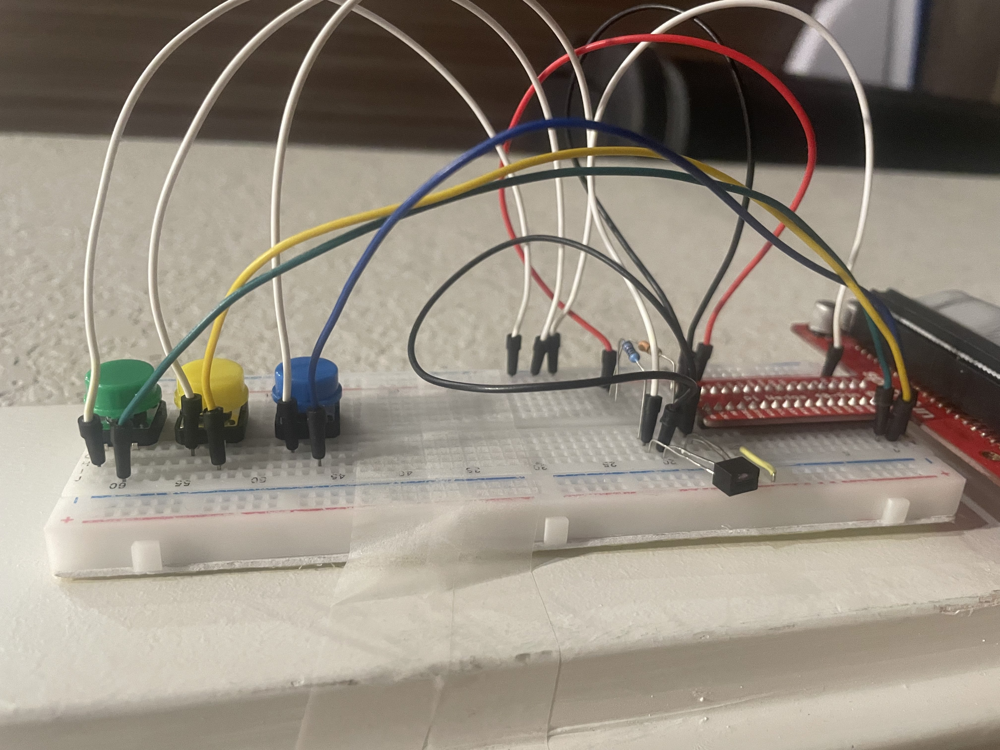
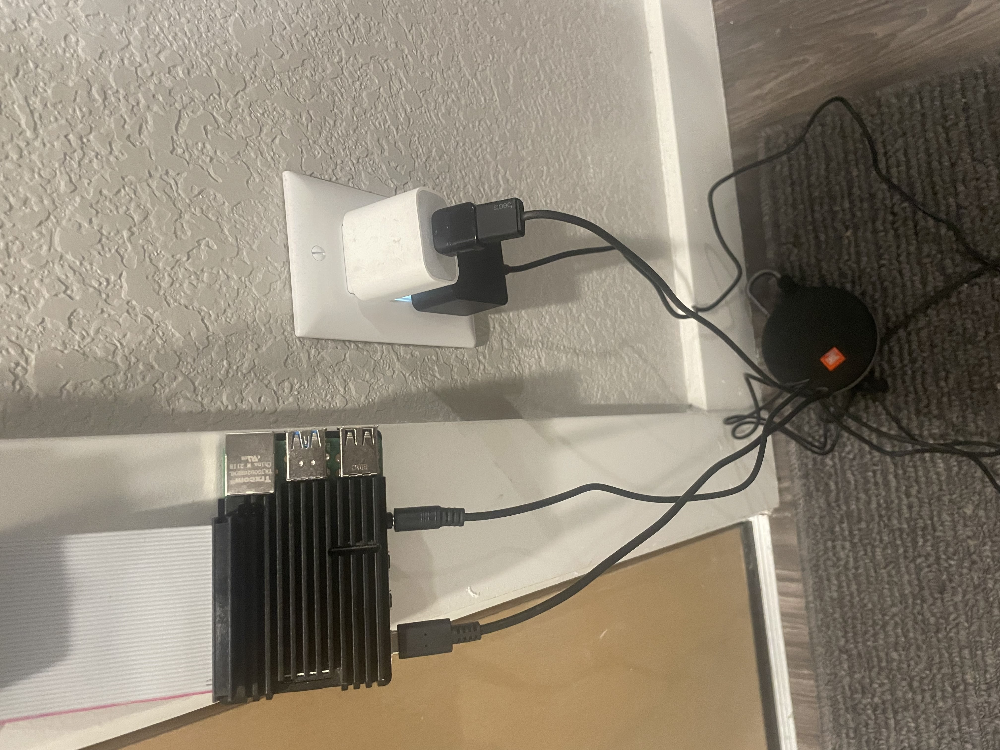

# Group 

* Nikolai Checkin, Lead Programmer
* Brady Jannell, Group leader

# Description

The Silly Security System or the SSS will play a sound when a door opens, or when a movement is detected. This will allow the person who opens the door to either make a cool entrance/exit with the preferred sound set. There are also three buttons allowing the user to increase to increase, decrease, or mute the sound output.

# Hardware

-QRD1114 Optical Detector to detect motion/opening door \
-$330 \mathsf{\Omega}$ current-limiting resistor and a $10 \mathsf{k\Omega}$ pull-up resistor for the optical detector set-up.\
-JBL clip 3 speaker with audio jack to output the sound played \
-3 buttons to increase or decrease the volume or mute the sound

# Operation
To set the SSS up, connect your Raspberry Pi and Speaker to a wall outlet with power adapters, and set the sensor system in close proximity to the door jamb, to detect the door movement but avoid collision with the sensor system. When the door is opened, the person entering will be greeted or sent off with a set sound. For the operator of the SSS, he green button closest to the edge of the breadboard increases output volume, yellow button decreases volume, and blue button completely mutes the output.

# Data

As stated in the capstone guidelines notebook, your project must have 4 data components:

1. **Collect** data
2. **Process** data
3. **Display** data
4. **Interpret** data

The Silly Security System first collects data using the phototransistor to detect when the door opens and the buttons for volume. Once the signal appears from the door being opened, our code processes the signal using a numpy array and plays a sound using the speaker. The operator can interpret the data by enjoying the sound over the speaker and using the buttons to adjust the volume of the projects success.

# Wiring
<img src=attachment:21c4a422-c745-4c84-bcdd-d82ad3ecddff.jpg width="600">
The previously listed components are wired to the specified Sparkfun Wedge GPIO Pins as shown above. Slight deviations from the convention include omitting the external resistors to the buttons, due to their internal pull up resistance, and connecting the portable speaker to a wall outlet to insure consistent operatiion and battery life.
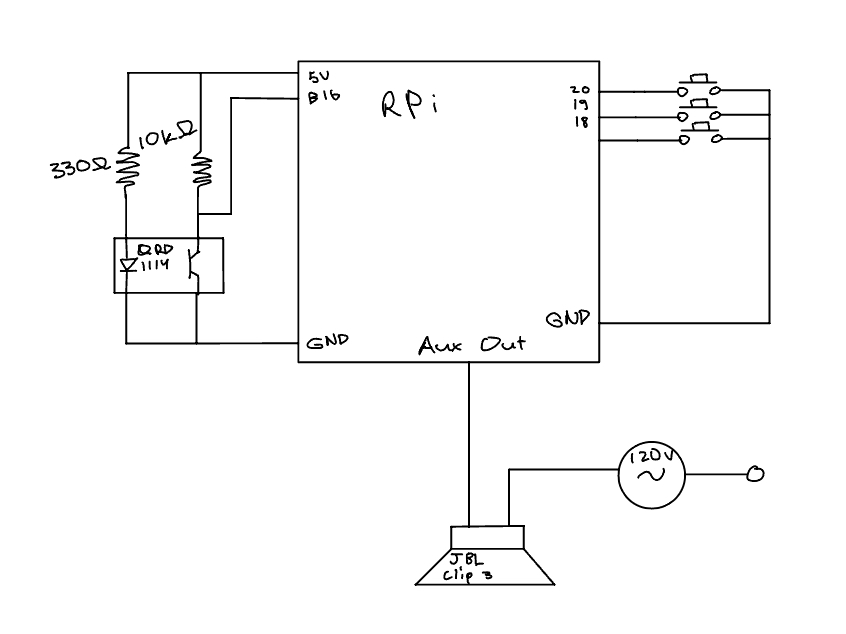

# Code


In [ ]:
import RPi.GPIO as GPIO
import time
import pygame
import numpy as np

pygame.mixer.init()
#function to play music using pygame library through native soundcard and speaker connected through aux cable
def playMusic(filePath, volume):
    try:
        pygame.mixer.music.set_volume(volume)
        pygame.mixer.music.load(filePath)
        pygame.mixer.music.play()
        # Wait until music playback is finished
        while pygame.mixer.music.get_busy():
            continue
    except Exception as e:
        print("Error:", e)

#function to control output volume through 3 buttons
def volumeControl(pinUp, pinDown, pinMute):
    volume = 0.5  # Initial volume
    maxVol = 1.0  #volume limitation necessary; pygames only accepts float from 0.0 to 1.0
    minVol = 0.0

    # Set up GPIO pins
    GPIO.setmode(GPIO.BCM)
    pinUp=20
    pinDown=19
    pinMute=18
    GPIO.setup(pinUp, GPIO.IN, pull_up_down=GPIO.PUD_UP)
    GPIO.setup(pinDown, GPIO.IN, pull_up_down=GPIO.PUD_UP)
    GPIO.setup(pinMute, GPIO.IN, pull_up_down=GPIO.PUD_UP)
    
    #nested function adjusting argument based on previous GPIO input
    def adjustVolume():
        nonlocal volume

        #reads button state
        buttonUp = GPIO.input(pinUp)
        buttonDown = GPIO.input(pinDown)
        buttonMute = GPIO.input(pinMute)

        #adjusts volume based on volume states
        if buttonUp == GPIO.LOW:
            volume += 0.1
        elif buttonDown == GPIO.LOW:
            volume -= 0.1
        elif buttonMute == GPIO.LOW:
            volume = 0

        #fix volume to acceptable output range
        volume = max(minVol, min(volume, maxVol))
        return volume
    return adjustVolume
#loop for music playback implementing above volume control function and input from phototransistor
try:
    GPIO.setmode(GPIO.BCM)
    #phototransistor gpio pin
    GPIO.setup(16, GPIO.IN)
    # initial volume
    volume = 0.5
    # reassigns button pins
    adjustVol = volumeControl(pinUp=20, pinDown=19, pinMute=18)
    #path to music file
    musicFilePath = "/home/csci250/Downloads/CROWD CHEER SOUND EFFECT.wav"

    while True:
        # adjust volume based on button input
        volume = adjustVolume()

        #read digital output from phototransistor
        digitalOutput = GPIO.input(16)

        if digitalOutput == GPIO.HIGH:
            print("Digital output: HIGH")
        else:
            playMusic(musicFilePath, volume)
        time.sleep(1)  # check every second

except KeyboardInterrupt:
    GPIO.cleanup()

# convert data arrays to NumPy arrays
phototransistorData = np.array(phototransistorData)
volumeData = np.array(volumeData)

# Print data arrays
print("Phototransistor data:", phototransistorData)
print("Volume data:", volumeData)

# Credits

[Pygame](https://www.pygame.org/docs/) 1.9.6
[NumPy] (https://numpy.org/doc/stable/) 1.26
